# Imports

In [1]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt

# Constants

In [2]:
BATCH_SIZE = 32
IMAGE_SIZE = 256
CHANNELS   = 3    # RGB
EPOCHS     = 10   # no. iterations to train the model

# Load Image Dataset

In [3]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "images",   # images path
    shuffle=True,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 2152 files belonging to 3 classes.


# Types of Classes

In [4]:
class_names = dataset.class_names
class_names

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

# Dimension of image_batch, label_batch
Each batch contains 32 images of size 256x256 with 3 RGB channels


In [5]:
for image_batch, label_batch in dataset.take(1):
    print(image_batch.shape)
    print(label_batch.numpy())

(32, 256, 256, 3)
[0 0 1 0 0 0 0 1 1 0 0 1 1 0 2 0 0 1 2 1 0 0 2 1 0 1 1 1 1 1 1 0]


# Displaying batch 1 images

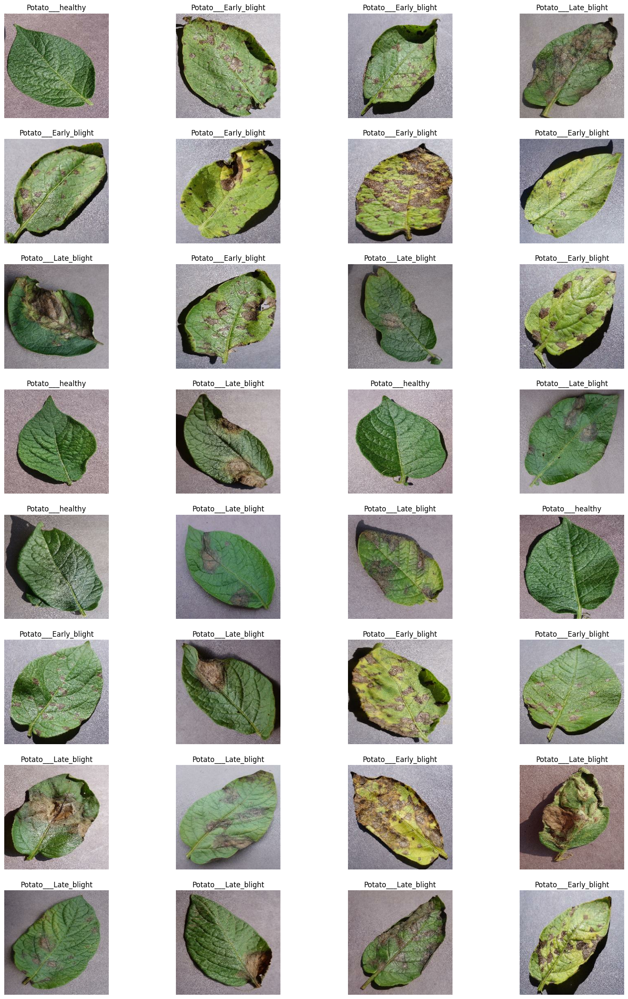

In [6]:
plt.figure(figsize=(20, 30))
for image_batch, label_batch in dataset.take(1):
    for i in range(BATCH_SIZE):
        ax = plt.subplot(BATCH_SIZE//4, 4, i + 1)   # row, col, idx
        plt.imshow(image_batch[i].numpy().astype("uint8"))   # converting float to int
        plt.title(class_names[label_batch[i]])
        plt.axis("off")

# Split Dataset into Categories: train, validation, test 

In [7]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + test_split + val_split) == 1
    
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)
    
    ds_size = len(ds)
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    
    train_ds = ds.take(train_size)    
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

# Print Datasets lengths

In [8]:
split_dataset = get_dataset_partitions_tf(dataset)

# print length of each set (in batch)

print("Total:", len(dataset))

for m, n in zip(("Train:", "Valid:", "Test: "), split_dataset):
    print(m, len(n))

Total: 68
Train: 54
Valid: 6
Test:  8


# Cache, Shuffle, and Prefetch the Dataset

In [9]:
train_ds, val_ds, test_ds = (ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE) for ds in split_dataset)

# Resizing and Normalization

In [10]:
resize_and_rescale = tf.keras.Sequential([
    layers.experimental.preprocessing.Resizing(IMAGE_SIZE, IMAGE_SIZE),
    layers.experimental.preprocessing.Rescaling(1./255),
])

# Data Augmentation

In [11]:
data_augmentation = tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation(0.2),
])

# Model Architecture

In [12]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)

model = models.Sequential([
    resize_and_rescale,
#     data_augmentation,
    
    # layering
    layers.Conv2D(32, kernel_size = (3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    
    # flatten
    layers.Flatten(),
    
    # dense layer
    layers.Dense(64, activation='relu'),
    layers.Dense(len(class_names), activation='softmax'),
])

model.build(input_shape=input_shape)

# Model Summary

In [13]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (32, 256, 256, 3)         0         
                                                                 
 conv2d (Conv2D)             (32, 254, 254, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2D  (32, 127, 127, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (32, 125, 125, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (32, 62, 62, 64)         0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (32, 60, 60, 64)         

# Compiling the Model

In [14]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

# Training

In [15]:
history = model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=EPOCHS,
)

Epoch 1/10
54/54 [==============================] - 82s 1s/step - loss: 0.8853 - accuracy: 0.4988 - val_loss: 0.7729 - val_accuracy: 0.6562
Epoch 2/10
54/54 [==============================] - 82s 2s/step - loss: 0.6428 - accuracy: 0.7049 - val_loss: 0.4399 - val_accuracy: 0.7708
Epoch 3/10
54/54 [==============================] - 80s 1s/step - loss: 0.4540 - accuracy: 0.8218 - val_loss: 0.4045 - val_accuracy: 0.8385
Epoch 4/10
54/54 [==============================] - 76s 1s/step - loss: 0.3830 - accuracy: 0.8495 - val_loss: 0.2630 - val_accuracy: 0.8958
Epoch 5/10
54/54 [==============================] - 77s 1s/step - loss: 0.2377 - accuracy: 0.9138 - val_loss: 0.1715 - val_accuracy: 0.9375
Epoch 6/10
54/54 [==============================] - 74s 1s/step - loss: 0.1397 - accuracy: 0.9491 - val_loss: 0.1378 - val_accuracy: 0.9531
Epoch 7/10
54/54 [==============================] - 75s 1s/step - loss: 0.1030 - accuracy: 0.9601 - val_loss: 0.3602 - val_accuracy: 0.9010
Epoch 8/10
54/54 [==

# Performance

In [16]:
scores = model.evaluate(test_ds)

8/8 [==============================] - 4s 359ms/step - loss: 0.1460 - accuracy: 0.9531


# Accuracy and Loss Graph

In [17]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

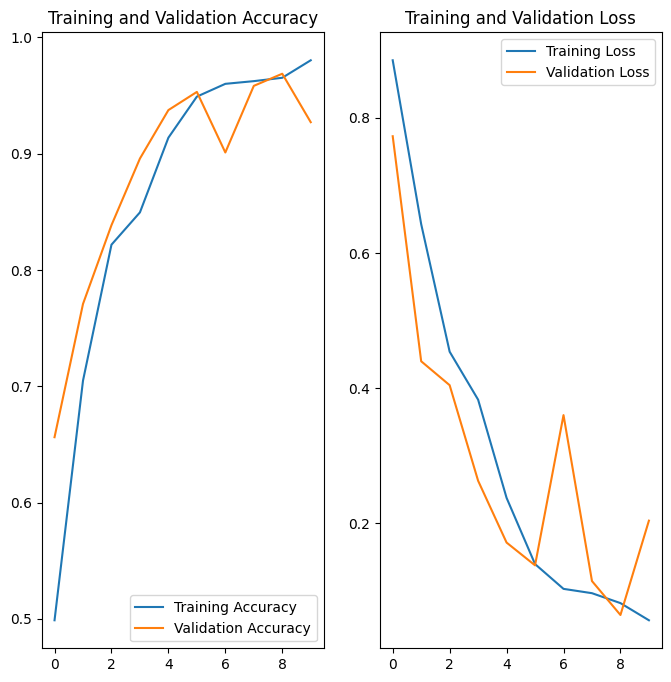

In [18]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

# Testing

1/1 [==============================] - 1s 503ms/step


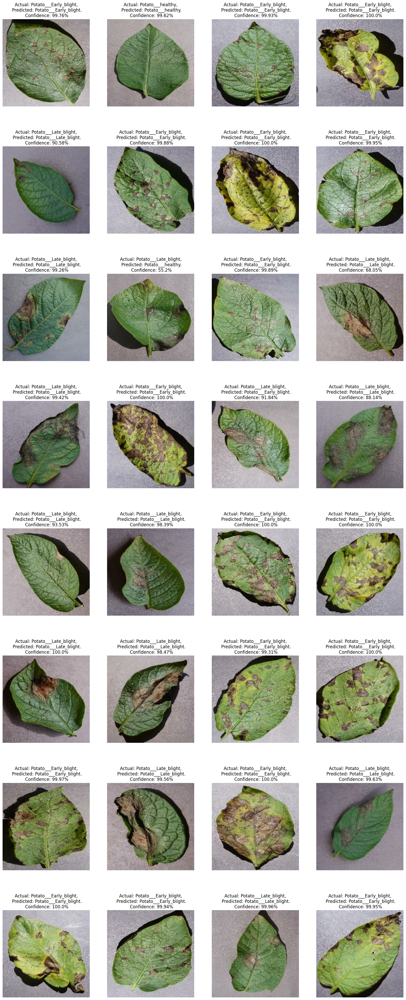

In [19]:
import numpy as np

plt.figure(figsize=(20, 50))
for image_batch, label_batch in test_ds.take(1):
    
    prediction_batch = model.predict(image_batch)   # contains array of size len(class_names) with confidence
    
    for i in range(BATCH_SIZE):
        
        image = image_batch[i].numpy().astype("uint8")   # converting float to int
        
        actual_class    = class_names[label_batch[i]]
        predicted_class = class_names[np.argmax(prediction_batch[i])]
        confidence      = round(100 * (np.max(prediction_batch[i])), 2)
        
        ax = plt.subplot(BATCH_SIZE//4, 4, i + 1)   # row, col, idx
        plt.imshow(image)   
        plt.title(class_names[label_batch[i]])
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        plt.axis("off")

# Saving the Model

In [20]:
import os

MODEL_PATH = "saved models"

if not os.path.exists(MODEL_PATH):
    os.mkdir(MODEL_PATH)

model_version=max([int(i.split('.',1)[0]) for i in os.listdir(MODEL_PATH) + ['0']])+1
model.save(f"{MODEL_PATH}/{model_version}.h5")